
# Advance Solution  :
I started with sound *.wav files, converted them into spectrograms, input them into a CNN plus Linear Classifier model, and produced predictions about the class ( Song ) to which the sound belongs.

I Trained model for 119 Epoch and Got following results:

**Epoch: 119, Loss: 0.14, Traning Accuracy: ( 97% - 98% )**

**Validation Accuracy : ( 52% - 70% )**

( I included range of accuracies beacuse as traning dataset get different number of audio files from different songs, model get affected. If we increse number of audio files per song, this model will fet improved. )

We can improve Validation accuracy, for that we have to consider large number of audio files per songClass in our traning dataset. 

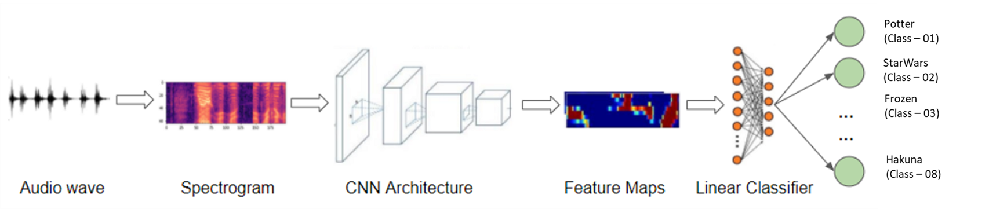

## Import Dataset from Google Drive

Dataset Contains 8 different types of Songs Audio files.
Total 98.
We are preprocessing given Dataset to build our required or desired dataset
as per follows :

The training data for this problem are classified as:


*   The features (X) are the audio file paths.
*   The target labels (y) are the class names.

song = "Potter" Class = 1

song = "StarWars" Class = 2

song = "Frozen" Class = 3

song="Panther" Class = 4

song = 'Rain' Class = 5

song = "Showman" Class = 6

song = "Mamma" Class = 7

song = "Hakuna" Class = 8








In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:


sample_path = '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/*.wav'
files = glob.glob(sample_path)
print(files)

['/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S3_whistle_1_Panther.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S6_whistle_1_Showman.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S1_hum_1_StarWars.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S4_hum_2_Frozen.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S2_hum_1_Showman.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S16_whistle_2_Frozen.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S32_hum_1_Rain.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S2_whistle_2_Potter.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S24_whistle_2_Frozen.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S16_hum_1_Showman.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S2_whistle_2_Showman.wav', '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/S16_whistle_2_Po

## ML Flow from start to end.



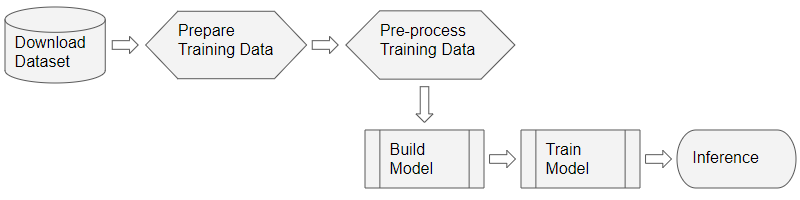

In [ ]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

# Preprocessing
Replace Song Name Colunm as Distinct Numric Class Value. We will use This Classes as our Target value during Model Building.

This training data with audio file paths cannot be input directly into the model. We have to load the audio data from the file and process it so that it is in a format that the model expects.

In [ ]:
MLENDHW_table = []
flag=0 

for file in files:
  file_name = file.split('/')[-1]
  flag=0
  try:
    song = file.split('/')[-1].split('_')[3].split('.')[0]
    if(song=="Potter"):
      song = 1
    elif(song=="StarWars"):
      song=2
    elif(song=="Frozen"):
      song=3
    elif(song=="Panther"):
      song=4
    elif(song=='Rain'):
      song=5
    elif(song=="Showman"):
      song=6
    elif(song=="Mamma"):
      song=7
    elif(song=="Hakuna"):
      song=8
    else:
      flag=1
    if flag==0:
      MLENDHW_table.append([file_name, song])
  except:
    pass
  
  

MLENDHW_table

[['S3_whistle_1_Panther.wav', 4],
 ['S6_whistle_1_Showman.wav', 6],
 ['S1_hum_1_StarWars.wav', 2],
 ['S4_hum_2_Frozen.wav', 3],
 ['S2_hum_1_Showman.wav', 6],
 ['S16_whistle_2_Frozen.wav', 3],
 ['S32_hum_1_Rain.wav', 5],
 ['S2_whistle_2_Potter.wav', 1],
 ['S24_whistle_2_Frozen.wav', 3],
 ['S16_hum_1_Showman.wav', 6],
 ['S2_whistle_2_Showman.wav', 6],
 ['S16_whistle_2_Potter.wav', 1],
 ['S29_whistle_2_Showman.wav', 6],
 ['S2_whistle_2_Frozen.wav', 3],
 ['S2_hum_1_StarWars.wav', 2],
 ['S4_hum_2_Hakuna.wav', 8],
 ['S16_whistle_2_Hakuna.wav', 8],
 ['S2_hum_1_Rain.wav', 5],
 ['S1_whistle_1_Panther.wav', 4],
 ['S24_whistle_2_Potter.wav', 1],
 ['S34_whistle_2_Mamma.wav', 7],
 ['S16_whistle_1_Panther.wav', 4],
 ['S6_whistle_2_Potter.wav', 1],
 ['S24_hum_1_Rain.wav', 5],
 ['S32_whistle_2_Hakuna.wav', 8],
 ['S15_whistle_2_Rain.wav', 5],
 ['S24_whistle_1_Panther.wav', 4],
 ['S24_hum_2_Potter.wav', 1],
 ['S15_whistle_2_Showman.wav', 6],
 ['S4_hum_4_Showman.wav', 6],
 ['S1_hum_2_Hakuna.wav', 8],
 ['


Check Dataset is Balanced or Not.

In [ ]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','song']) 
MLENDHW_df
MLENDHW_df.groupby('song').count()

,file_id
song,
1,34
2,31
3,32
4,34
5,34
6,33
7,29
8,34


# Read audio from a file
The first thing we need is to read and load the audio file in “.wav” format as per our project specification. Since we are using Pytorch for this example, the implementation below uses torchaudio for the audio processing, but librosa will work just as well. Librosa use we saw in earlier solution.

In this code we are taking care of Mono & Stereo Sounds.

The difference between monophonic (mono) and stereophonic (stereo) sound is the number of channels used to record and playback audio. Mono signals are recorded and played back using a single audio channel, while stereo sounds are recorded and played back using two audio channels. As a listener, the most noticeable difference is that stereo sounds are capable of producing the perception of width, whereas mono sounds are not.

We are using following libraries for this task.
* torch
* torchaudio - Torchaudio is a library for audio and signal processing with PyTorch. It provides I/O, signal and data processing functions, datasets, model implementations and application components
* Ipython.display.Audio

In [ ]:
import math, random
import torch
import torchaudio
from torchaudio import transforms
from IPython.display import Audio

class AudioUtil():
  # ----------------------------
  # Load an audio file. Return the song audio signal as a tensor and the sample rate
  # ----------------------------
  @staticmethod
  def open(audio_file):
    sig, sr = torchaudio.load(audio_file)
    return (sig, sr)
  
  def rechannel(aud, new_channel):
    sig, sr = aud

    if (sig.shape[0] == new_channel):
      
      return aud

    if (new_channel == 1):
      # Convert from stereo to mono by selecting only the first channel
      resig = sig[:1, :]
    else:
      # Convert from mono to stereo by duplicating the first channel
      resig = torch.cat([sig, sig])

    return ((resig, sr))

  def resample(aud, newsr):
    sig, sr = aud

    if (sr == newsr):
      # Nothing to do
      return aud

    num_channels = sig.shape[0]
    # Resample first channel
    resig = torchaudio.transforms.Resample(sr, newsr)(sig[:1,:])
    if (num_channels > 1):
      # Resample the second channel and merge both channels
      retwo = torchaudio.transforms.Resample(sr, newsr)(sig[1:,:])
      resig = torch.cat([resig, retwo])

    return ((resig, newsr))
  
  def pad_trunc(aud, max_ms):
    sig, sr = aud
    num_rows, sig_len = sig.shape
    max_len = sr//1000 * max_ms

    if (sig_len > max_len):
      # Truncate the signal to the given length
      sig = sig[:,:max_len]

    elif (sig_len < max_len):
      # Length of padding to add at the beginning and end of the signal
      pad_begin_len = random.randint(0, max_len - sig_len)
      pad_end_len = max_len - sig_len - pad_begin_len

      # Pad with 0s
      pad_begin = torch.zeros((num_rows, pad_begin_len))
      pad_end = torch.zeros((num_rows, pad_end_len))

      sig = torch.cat((pad_begin, sig, pad_end), 1)
      
    return (sig, sr)

  def time_shift(aud, shift_limit):
    sig,sr = aud
    _, sig_len = sig.shape
    shift_amt = int(random.random() * shift_limit * sig_len)
    return (sig.roll(shift_amt), sr)

  def spectro_gram(aud, n_mels=64, n_fft=1024, hop_len=None):
    sig,sr = aud
    top_db = 80

    # spec has shape [channel, n_mels, time], where channel is mono, stereo etc
    spec = transforms.MelSpectrogram(sr, n_fft=n_fft, hop_length=hop_len, n_mels=n_mels)(sig)

    # Convert to decibels
    spec = transforms.AmplitudeToDB(top_db=top_db)(spec)
    return (spec)

  def spectro_augment(spec, max_mask_pct=0.1, n_freq_masks=1, n_time_masks=1):
    _, n_mels, n_steps = spec.shape
    mask_value = spec.mean()
    aug_spec = spec

    freq_mask_param = max_mask_pct * n_mels
    for _ in range(n_freq_masks):
      aug_spec = transforms.FrequencyMasking(freq_mask_param)(aug_spec, mask_value)

    time_mask_param = max_mask_pct * n_steps
    for _ in range(n_time_masks):
      aug_spec = transforms.TimeMasking(time_mask_param)(aug_spec, mask_value)

    return aug_spec

# **Custom Data Loader**
Now that we have defined all the pre-processing transform functions we will define a **custom Pytorch Dataset object.**
To feed your data to a model with Pytorch, we need two objects:
 

*   A custom Dataset object that uses all the audio transforms to pre-process an audio file and prepares one data item at a time.
*   A built-in DataLoader object that uses the Dataset object to fetch individual data items and packages them into a batch of data.




**Demo Steps for Converting Audio Signals to Spectrogram**

In [ ]:
duration = 4000
sr =  11000
channel = 2
shift_pct = 0.4
data_path = '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/'
audio_file = data_path + str(MLENDHW_df.loc[2,'file_id'])

print(AudioUtil.open(audio_file))

aud = AudioUtil.open(audio_file)
   
reaud = AudioUtil.resample(aud, sr)
rechan = AudioUtil.rechannel(reaud, channel)

dur_aud = AudioUtil.pad_trunc(rechan, duration)  #resize all signals to fixed length
shift_aud = AudioUtil.time_shift(dur_aud, shift_pct)
sgram = AudioUtil.spectro_gram(shift_aud, n_mels=64, n_fft=1024, hop_len=None)
aug_sgram = AudioUtil.spectro_augment(sgram, max_mask_pct=0.1, n_freq_masks=2, n_time_masks=2)
aug_sgram

(tensor([[0.0006, 0.0006, 0.0006,  ..., 0.0018, 0.0015, 0.0017]]), 44100)


tensor([[[ -4.2453, -22.1986, -22.0097,  ..., -24.7010, -25.3342, -25.4735],
         [ -1.2296, -18.6151, -15.7200,  ..., -16.2599, -21.2994, -21.1494],
         [  2.5460,  -7.0778,  -5.8574,  ...,  -5.6157, -12.9295, -17.7303],
         ...,
         [-41.5689, -48.8219, -53.8032,  ..., -49.2450, -57.3599, -29.9905],
         [-40.1220, -52.1410, -57.9477,  ..., -58.3299, -58.2775, -35.8817],
         [-45.3122, -58.5392, -59.2727,  ..., -59.2741, -59.5038, -39.0086]],

        [[ -4.2453, -22.1986, -22.0097,  ..., -24.7010, -25.3342, -25.4735],
         [ -1.2296, -18.6151, -15.7200,  ..., -16.2599, -21.2994, -21.1494],
         [  2.5460,  -7.0778,  -5.8574,  ...,  -5.6157, -12.9295, -17.7303],
         ...,
         [-41.5689, -48.8219, -53.8032,  ..., -49.2450, -57.3599, -29.9905],
         [-40.1220, -52.1410, -57.9477,  ..., -58.3299, -58.2775, -35.8817],
         [-45.3122, -58.5392, -59.2727,  ..., -59.2741, -59.5038, -39.0086]]])

In [ ]:
from torch.utils.data import DataLoader, Dataset, random_split
import torchaudio

# ----------------------------
# Sound Dataset
# ----------------------------
class SoundDS(Dataset):
  def __init__(self, df, data_path):
    self.df = df
    self.data_path = str(data_path)
    self.duration = 4000
    self.sr =  11000
    self.channel = 2
    self.shift_pct = 0.4
            
  # ----------------------------
  # Number of items in dataset
  # ----------------------------
  def __len__(self):
    return len(self.df)    
    
  # ----------------------------
  # Get i'th item in dataset
  # ----------------------------
  def __getitem__(self, idx):
    # Absolute file path of the audio file - concatenate the audio directory with
    # the relative path
    audio_file = self.data_path + str(self.df.loc[idx,'file_id'])
    # Get the Song ID
    class_id = int(self.df.loc[idx, 'song'])
    print(AudioUtil.open(audio_file))

    aud = AudioUtil.open(audio_file)
   
    reaud = AudioUtil.resample(aud, self.sr)
    rechan = AudioUtil.rechannel(reaud, self.channel)

    dur_aud = AudioUtil.pad_trunc(rechan, self.duration)
    shift_aud = AudioUtil.time_shift(dur_aud, self.shift_pct)
    sgram = AudioUtil.spectro_gram(shift_aud, n_mels=64, n_fft=1024, hop_len=None)
    aug_sgram = AudioUtil.spectro_augment(sgram, max_mask_pct=0.1, n_freq_masks=2, n_time_masks=2)

    return aug_sgram, class_id

# **Prepared Batches of Data with the Data Loader for traning & Validation**
All of the functions we need to input our data to the model have now been defined.


*   We use our custom Dataset to load the Features and Labels from our Pandas dataframe and split that data randomly in an 90:10 ratio into training and validation sets.
*  We then use them to create our training and validation Data Loaders.


 

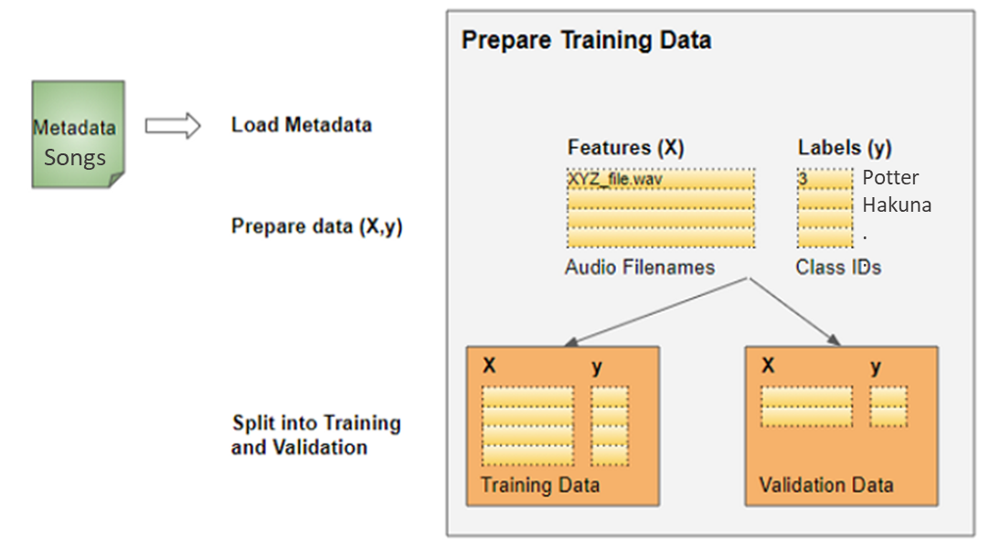

In [ ]:
sample_path1 = '/content/drive/MyDrive/Data/MLEndHW/sample/MLEndHW_Sample/'


In [ ]:
from torch.utils.data import random_split
from torch.utils.data import DataLoader

#MLENDHW_df = PandasDataset(MLENDHW_df)
myds = SoundDS(MLENDHW_df, sample_path1)

# Random split of 90:10 between training and validation
num_items = len(myds)
num_train = round(num_items * 0.8)
num_val = num_items - num_train
train_ds, val_ds = random_split(myds, [num_train, num_val])
#train_ds = PandasDataset(train_ds)
#val_ds = PandasDataset(val_ds)

numTD = round(num_items * 0.6)
numD = num_items - numTD
traD, vaD = random_split(myds, [numTD, numD])

# Create training and validation data loaders
train_dl = DataLoader(train_ds, batch_size=4)
val_dl = DataLoader(vaD, batch_size=4)

In [ ]:
train_dl

# **Model**
Since our data now consists of Spectrogram images, we build a CNN classification architecture to process them. It has four convolutional blocks which generate the feature maps. That data is then reshaped into the format we need so it can be input into the linear classifier layer, which finally outputs the predictions for the 8 song classes.


--------------------------------------------------------------------------------


**Spectrogram ▶**

A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams. 

Spectrograms are used extensively in the fields of music speech processing,seismology, and others. Spectrograms of audio can be used to identify spoken words phonetically, and to analyse the various audio patterns

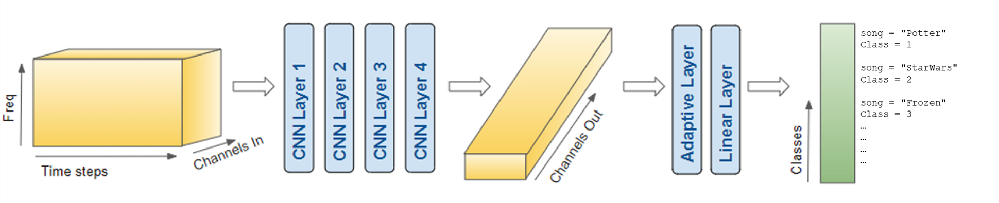

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init

# ----------------------------
# Audio Classification Model
# ----------------------------
class AudioClassifier (nn.Module):
    # ----------------------------
    # Build the model architecture
    # ----------------------------
    def __init__(self):
        super().__init__()
        conv_layers = []

        # First Convolution Block with Relu and Batch Norm. Use Kaiming Initialization
        self.conv1 = nn.Conv2d(2, 8, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
        self.relu1 = nn.ReLU()
        self.bn1 = nn.BatchNorm2d(8)
        init.kaiming_normal_(self.conv1.weight, a=0.1)
        self.conv1.bias.data.zero_()
        conv_layers += [self.conv1, self.relu1, self.bn1]

        # Second Convolution Block
        self.conv2 = nn.Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        self.relu2 = nn.ReLU()
        self.bn2 = nn.BatchNorm2d(16)
        init.kaiming_normal_(self.conv2.weight, a=0.1)
        self.conv2.bias.data.zero_()
        conv_layers += [self.conv2, self.relu2, self.bn2]

        # Second Convolution Block
        self.conv3 = nn.Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        self.relu3 = nn.ReLU()
        self.bn3 = nn.BatchNorm2d(32)
        init.kaiming_normal_(self.conv3.weight, a=0.1)
        self.conv3.bias.data.zero_()
        conv_layers += [self.conv3, self.relu3, self.bn3]

        # Second Convolution Block
        self.conv4 = nn.Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        self.relu4 = nn.ReLU()
        self.bn4 = nn.BatchNorm2d(64)
        init.kaiming_normal_(self.conv4.weight, a=0.1)
        self.conv4.bias.data.zero_()
        conv_layers += [self.conv4, self.relu4, self.bn4]

        # Linear Classifier
        self.ap = nn.AdaptiveAvgPool2d(output_size=1)
        self.lin = nn.Linear(in_features=64, out_features=10)

        # Wrap the Convolutional Blocks
        self.conv = nn.Sequential(*conv_layers)
 
    # ----------------------------
    # Forward pass computations
    # ----------------------------
    def forward(self, x):
        # Run the convolutional blocks
        x = self.conv(x)

        # Adaptive pool and flatten for input to linear layer
        x = self.ap(x)
        x = x.view(x.shape[0], -1)

        # Linear layer
        x = self.lin(x)

        # Final output
        return x

# Create the model and put it on the GPU if available
myModel = AudioClassifier()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
myModel = myModel.to(device)
# Check that it is on Cuda
next(myModel.parameters()).device

device(type='cpu')

In [ ]:
def tuple_of_tensors_to_tensor(tuple_of_tensors):
    return  torch.stack(list(tuple_of_tensors), dim=0)

# **Training Audio Song Files**

I defined the functions for the optimizer, loss, and scheduler to dynamically vary our learning rate as training progresses, which usually allows training to converge in fewer epochs.
I trained the model for several epochs nearly more than 80+, processing a batch of data in each iteration. I kept track of a simple accuracy metric which measures the percentage of correct predictions.

In [ ]:
def training(model, train_dl, num_epochs):
  # Loss Function, Optimizer and Scheduler
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model.parameters(),lr=0.001)
  scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.001,
                                                steps_per_epoch=int(len(train_dl)),
                                                epochs=num_epochs,
                                                anneal_strategy='linear')

  # Repeat for each epoch
  
  
  for epoch in range(num_epochs):
    running_loss = 0.0
    correct_prediction = 0
    total_prediction = 0
    first = 0


    # Repeat for each batch in the training set
    for i, data in enumerate(train_dl):
        # Get the input features and target labels, and put them on the GPU
        
        inputs, labels = data[0], data[1]
        # Normalize the inputs
        inputs_m, inputs_s = inputs.mean(), inputs.std()
        inputs = (inputs - inputs_m) / inputs_s

        # Zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        labels = tuple_of_tensors_to_tensor(labels)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        scheduler.step()

        # Keep stats for Loss and Accuracy
        running_loss += loss.item()

        # Get the predicted class with the highest score
        _, prediction = torch.max(outputs,1)

        # Count of predictions that matched the target label
        correct_prediction += (prediction == labels).sum().item()
        total_prediction += prediction.shape[0]

        #if i % 10 == 0:    # print every 10 mini-batches
        #    print('[%d, %5d] loss: %.3f' % (epoch + 1, i + 1, running_loss / 10))
    
    # Print stats at the end of the epoch
    num_batches = len(train_dl)
    avg_loss = running_loss / num_batches
    acc = correct_prediction/total_prediction
    print(f'Epoch: {epoch}, Loss: {avg_loss:.2f}, Accuracy: {acc:.2f}')

  print('Finished Training')
  
num_epochs=200  # Just for demo, adjust this higher.
training(myModel, train_dl, num_epochs)

Streaming output truncated to the last 5000 lines.
         1.6144e-02],
        [0.0000e+00, 1.8311e-04, 1.8311e-04,  ..., 1.8646e-02, 1.7487e-02,
         1.6052e-02]]), 44100)
(tensor([[-3.9062e-03, -3.1433e-03, -3.6011e-03,  ...,  4.5776e-04,
          6.1035e-05,  2.8687e-03],
        [-3.3875e-03, -2.6550e-03, -2.2583e-03,  ..., -3.3569e-04,
          1.6479e-03,  2.3193e-03]]), 44100)
(tensor([[-0.0004, -0.0005, -0.0006,  ..., -0.0051, -0.0051, -0.0051]]), 44100)
(tensor([[-0.0016, -0.0015, -0.0016,  ...,  0.0033,  0.0032,  0.0035]]), 44100)
(tensor([[ 0.0013,  0.0013,  0.0013,  ..., -0.0007, -0.0005, -0.0007],
        [ 0.0014,  0.0013,  0.0013,  ..., -0.0006, -0.0006, -0.0006]]), 44100)
(tensor([[0.0025, 0.0026, 0.0025,  ..., 0.0052, 0.0045, 0.0035],
        [0.0025, 0.0025, 0.0025,  ..., 0.0053, 0.0044, 0.0036]]), 44100)
(tensor([[0.0026, 0.0024, 0.0022,  ..., 0.0057, 0.0070, 0.0079]]), 44100)
(tensor([[0.0006, 0.0004, 0.0003,  ..., 0.0010, 0.0011, 0.0009]]), 44100)
(tensor([

## **Validation Part**

In [ ]:
def inference (model, val_dl):
  correct_prediction = 0
  total_prediction = 0

  # Disable gradient updates
  with torch.no_grad():
    for data in val_dl:
      # Get the input features and target labels, and put them on the GPU
      inputs, labels = data[0], data[1]

      # Normalize the inputs
      inputs_m, inputs_s = inputs.mean(), inputs.std()
      inputs = (inputs - inputs_m) / inputs_s

      # Get predictions
      outputs = model(inputs)
      print("Outputs-------------------")
      print(outputs)

      # Get the predicted class with the highest score
      _, prediction = torch.max(outputs,1)
      # Count of predictions that matched the target label
      correct_prediction += (prediction == labels).sum().item()
      total_prediction += prediction.shape[0]
    
  acc = correct_prediction/total_prediction
  print(f'Accuracy: {acc:.2f}')

# Run inference on trained model with the validation set
inference(myModel, val_dl)

(tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0209, 0.0203, 0.0214],
        [0.0000, 0.0000, 0.0000,  ..., 0.0273, 0.0275, 0.0251]]), 44100)
(tensor([[ 0.0372,  0.0347,  0.0355,  ..., -0.0009,  0.0019,  0.0009],
        [ 0.0264,  0.0236,  0.0233,  ...,  0.0001, -0.0028, -0.0009]]), 44100)
(tensor([[-6.1035e-05,  0.0000e+00,  2.1362e-04,  ..., -3.3569e-04,
         -3.3569e-04, -3.0518e-04],
        [-1.2207e-04,  9.1553e-05,  9.1553e-05,  ..., -3.9673e-04,
         -2.4414e-04, -4.2725e-04]]), 44100)
(tensor([[ 3.0518e-05,  3.0518e-05,  3.0518e-05,  ...,  3.0518e-05,
          6.1035e-05,  9.1553e-05],
        [ 3.0518e-05,  3.0518e-05,  3.0518e-05,  ...,  1.2207e-04,
         -9.1553e-05,  1.5259e-04]]), 44100)
Outputs-------------------
tensor([[-8.0015,  1.3914, -1.1336, -3.6495, -1.6471,  1.7962, -1.7271, -1.4191,
          6.5046, -8.2061],
        [-9.4181,  0.8829, -4.5270,  3.3689, -1.0751,  4.2740, -1.3723,  1.2318,
         -3.8506, -9.6976],
        [-8.2884,  0.8940, -3.4678,